## **Shadow Removal**

**Elahe Khodaverdi - Fereshte Bagheri**

---

## **Description**

The Shadow Removal project processes images to detect and eliminate shadows, enhancing the visibility of objects in scenes. It uses a combination of LAB and BGR color spaces to identify shadow regions and adjusts these areas accordingly. The project works by creating a mask of shadowed areas, applying morphological transformations, and correcting the colors based on surrounding non-shadow regions. After applying shadow removal techniques, the resulting image is displayed and optionally saved for further use.

---

## **Requirements**
- **Libraries**: OpenCV, NumPy, Matplotlib, Scikit-Image
- **File Structure**:
  - Input images stored in `images/`
  - Processed images saved in the output directory

---

## **Outputs**
1. **Images**:
   - Original image
   - Image with detected shadow regions
   - Image with shadows removed and corrected

### **Sample Outputs**
- Processed shadow-free images are saved with the suffix `_shadowClear` in the file name.

---

## **Algorithm Details**
1. **Shadow Region Detection**:
   - Converts the image to LAB color space and applies thresholds to detect shadow regions.
   - Uses connected components to identify contiguous shadow areas.
   
2. **Shadow Removal**:
   - Uses color correction techniques (LAB or BGR) to adjust the detected shadow regions based on non-shadow areas.
   - A median filter is applied to smooth edges around the shadow region.

3. **Processing**:
   - Iterates over labeled shadow regions, performs dilation for boundary expansion, and applies the shadow removal process for each region.
   - Displays the original image, shadow regions, and the final shadow-corrected image side by side.

4. **Output Generation**:
   - Shadow-cleared images are displayed and optionally saved in the output directory.

# Requirements

In [34]:
import cv2
import os
import numpy as np
from skimage import measure
import matplotlib.pyplot as plt
from typing import Tuple, List

# Median Filter From Scratch

In [35]:
# Function to apply a median filter to a specific point in an image
def median_filter(img: np.ndarray, point: np.ndarray, filter_size: int) -> List:
    # Calculate the indices of the neighborhood around the point based on the filter size
    x, y = point
    half = filter_size // 2
    x_list = range(x - half, x + half + 1)
    y_list = range(y - half, y + half + 1)

    # Filter out indices that are outside the image boundaries
    x_list = [i for i in x_list if 0 <= i < img.shape[0]]
    y_list = [i for i in y_list if 0<= i < img.shape[1]]


    # Initialize a list to store the pixel values for each channel (R, G, B)
    r_values = []
    g_values = []
    b_values = []

    # Loop through each color channel (R, G, B) to gather pixel values from the neighborhood
    for i in x_list:
        for j in y_list:
            r, g, b = img[i, j]
            r_values.append(r)
            g_values.append(g)
            b_values.append(b)

    # Return the median values for the R, G, B channels
    result = list(map(np.median, [r_values, g_values, b_values]))
    return result

First, the indices of the neighbors are calculated then the valid ones are kept. then, the median for each channel is calculated and returned.

In [36]:
# Function to apply the median filter to the edges of an image based on a list of contours
def edge_median_filter(img: np.ndarray, contours_list: tuple, filter_size: int = 7) -> np.ndarray:
    # Create a copy of the input image to avoid modifying the original
    temp_img = np.copy(img)

    # Loop through each contour in the list
    for partition in contours_list:
        for point in partition:
            x, y = point[0][0], point[0][1]
            # Apply the median filter to the current point in the contour
            temp_img[y][x] = median_filter(img, (x, y), filter_size)

    # Convert the image from HSV to BGR color space and return it
    return cv2.cvtColor(temp_img, cv2.COLOR_HSV2BGR)

Shadows cause rough edges between the shadowed and the non-shadowed regions. By applying the median filter to contours we can smooth out these disjoint boundries.

In [37]:
def display_region(
    org_image: np.ndarray,
    shadow_clear_image: np.ndarray,
    label: int,
    label_region: np.ndarray,
    contours: tuple,
) -> None:
    # For debugging, create a mask by inverting the label_region
    # Convert the mask to BGR format
    reverse_mask = cv2.bitwise_not(label_region)
    
    # Apply the mask to the original image to cut out the shadow region
    img_w_hole = cv2.bitwise_not(label_region)

    # Convert the label_region to BGR format for visualization
    temp_filter = cv2.cvtColor(label_region, cv2.COLOR_GRAY2BGR )
    
    # Draw contours on the temp_filter image using the specified contours
    # -1 indicates drawing all contours
    cv2.drawContours(temp_filter, contours, -1, (255, 0, 0), 3)
    
    # Create a figure with 2x2 subplots and specify the figure size
    fig, axes = plt.subplots(2, 2, figsize=(18, 10))

    # Flatten the axes array for easy indexing
    ax = axes.ravel()

    # Set the title for the entire figure
    plt.suptitle(f"Shadow Region {label}")

    # Display the original image in the first subplot
    ax[0].imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB))
    ax[0].axis("off")  # Turn off the axis for a cleaner look
    ax[0].set_title("Original Image")  # Set the title for the first subplot

    # Display the shadow region with contours in the second subplot
    ax[1].imshow(cv2.cvtColor(temp_filter, cv2.COLOR_BGR2RGB))
    ax[1].axis("off")  # Turn off the axis for a cleaner look
    ax[1].set_title("Shadow Region")  # Set the title for the second subplot

    # Display the original image with the shadow region cut out in the third subplot
    ax[2].imshow(cv2.cvtColor(img_w_hole, cv2.COLOR_BGR2RGB))
    ax[2].axis("off")  # Turn off the axis for a cleaner look
    ax[2].set_title("Shadow Region Cut")  # Set the title for the third subplot

    # Display the corrected image in the fourth subplot
    ax[3].imshow(cv2.cvtColor(shadow_clear_image, cv2.COLOR_BGR2RGB))
    ax[3].axis("off")  # Turn off the axis for a cleaner look
    ax[3].set_title("Corrected Image")  # Set the title for the fourth subplot

    # Adjust the layout to prevent overlapping and improve appearance
    plt.tight_layout()
    
    # Display the figure with all subplots
    plt.show()


In [38]:
def correct_region_lab(
    org_img: np.ndarray,
    shadow_clear_img: np.ndarray,
    shadow_indices: np.ndarray,
    non_shadow_indices: np.ndarray,
) -> np.ndarray:
    # Q: Rather than asking for RGB constants individually, why not adjust L only?
    # A: L component isn't enough to REVIVE the colors that were under the shadow.

    # Calculate average LAB values in current shadow region and non-shadow areas
    shadow_average_lab = cv2.cvtColor(shadow_clear_img, cv2.COLOR_BGR2LAB)

    # Get the average LAB from border areas
    border_average_lab = np.mean(shadow_clear_img_lab[shadow_indices[0], shadow_indices[1]], axis=0)

    # Calculate ratios that are going to be used on clearing the current shadow region
    # This is different for each region, therefore calculated each time
    lab_ratio = border_average_lab / shadow_average_lab

    shadow_clear_img = cv2.cvtColor(shadow_clear_img, cv2.COLOR_BGR2LAB)
    shadow_clear_img[shadow_indices[0], shadow_indices[1]] = np.uint8(
        shadow_clear_img[shadow_indices[0], shadow_indices[1]] * lab_ratio
    )
    shadow_clear_img = cv2.cvtColor(shadow_clear_img, cv2.COLOR_LAB2BGR)

    return shadow_clear_img

In [39]:
def correct_region_bgr(
    org_img: np.ndarray,
    shadow_clear_img: np.ndarray,
    shadow_indices: np.ndarray,
    non_shadow_indices: np.ndarray,
) -> np.ndarray:
    # Calculate average BGR values in current shadow region and non-shadow areas
    shadow_average_bgr = np.mean(
        org_img[shadow_indices[0], shadow_indices[1], :], axis=0
    )

    # Get the average BGR from border areas
    border_average_bgr = np.mean(
        org_img[non_shadow_indices[0], non_shadow_indices[1], :], axis=0
    )
    bgr_ratio = border_average_bgr / shadow_average_bgr

    # Adjust BGR
    shadow_clear_img[shadow_indices[0], shadow_indices[1]] = np.uint8(
        shadow_clear_img[shadow_indices[0], shadow_indices[1]] * bgr_ratio
    )

    return shadow_clear_img

In [40]:
def process_regions(
    org_image: np.ndarray,
    mask: np.ndarray,
    lab_adjustment: bool,
    shadow_dilation_kernel_size: int,
    shadow_dilation_iteration: int,
    shadow_size_threshold: int,
    verbose: bool,
) -> np.ndarray:
    lab_img = cv2.cvtColor(org_image, cv2.COLOR_BGR2LAB)
    shadow_clear_img = np.copy(org_image)  # Used for constructing corrected image

    # We need connected components
    # Initialize the labels of the blobs in our binary image
    labels = measure.label(mask)

    non_shadow_kernel_size = (shadow_dilation_kernel_size, shadow_dilation_kernel_size)
    non_shadow_kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE, non_shadow_kernel_size
    )

    CHANNEL_MAX = 255

    # Now, we will iterate over each label's pixels
    for label in np.unique(labels):
        if not label == 0:
            temp_filter = np.zeros(mask.shape, dtype="uint8")
            temp_filter[labels == label] = CHANNEL_MAX

            # Only consider blobs with size above threshold
            if cv2.countNonZero(temp_filter) >= shadow_size_threshold:
                shadow_indices = np.where(temp_filter == CHANNEL_MAX)

                non_shadow_temp_filter = cv2.dilate(
                    temp_filter, non_shadow_kernel, iterations=shadow_dilation_iteration
                )

                # Get the new set of indices and remove shadow indices from them
                non_shadow_temp_filter = cv2.bitwise_xor(
                    non_shadow_temp_filter, temp_filter
                )
                non_shadow_indices = np.where(non_shadow_temp_filter == CHANNEL_MAX)

                # Contours are used for extracting the edges of the current shadow region
                contours, hierarchy = cv2.findContours(
                    temp_filter, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
                )

                if lab_adjustment:
                    shadow_clear_img = correct_region_lab(
                        lab_img, shadow_clear_img, shadow_indices, non_shadow_indices
                    )
                else:
                    shadow_clear_img = correct_region_bgr(
                        org_image, shadow_clear_img, shadow_indices, non_shadow_indices
                    )

                # Then apply median filtering over edges to smooth them
                # At least on the images I tried, this doesn't work as intended.
                # It is possible that this is the result of using a high frequency image only

                # Image is converted to HSV before filtering, as BGR components of the image
                # is more interconnected, therefore filtering each channel independently wouldn't be correct
                image_hsv = cv2.cvtColor(shadow_clear_img, cv2.COLOR_BGR2HSV)
                shadow_clear_img = edge_median_filter(image_hsv, contours)

                if verbose:
                    display_region(org_image, shadow_clear_img, label, temp_filter, contours)

    return shadow_clear_img

In [41]:
def calculate_mask(
    org_image: np.ndarray, ab_threshold: int, region_adjustment_kernel_size: int
) -> np.ndarray:
    lab_img = cv2.cvtColor(org_image, cv2.COLOR_BGR2LAB)

    # Convert the L,A,B from 0 to 255 to 0 - 100 and -128 - 127 and -128 - 127 respectively
    l_range = (0, 100)
    ab_range = (-128, 127)

    lab_img = lab_img.astype("int16")
    lab_img[:, :, 0] = lab_img[:, :, 0] * l_range[1] / 255
    lab_img[:, :, 1] += ab_range[0]
    lab_img[:, :, 2] += ab_range[0]

    # Calculate the mean values of L, A and B across all pixels
    means = [np.mean(lab_img[:, :, i]) for i in range(3)]
    thresholds = [means[i] - (np.std(lab_img[:, :, i]) / 3) for i in range(3)]

    # Apply threshold using only L
    if sum(means[1:]) <= ab_threshold:
        mask = cv2.inRange(
            lab_img,
            (l_range[0], ab_range[0], ab_range[0]),
            (thresholds[0], ab_range[1], ab_range[1]),
        )
    else:  # Else, also consider B channel
        mask = cv2.inRange(
            lab_img,
            (l_range[0], ab_range[0], ab_range[0]),
            (thresholds[0], ab_range[1], thresholds[2]),
        )

    kernel_size = (region_adjustment_kernel_size, region_adjustment_kernel_size)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, mask)
    cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, mask)

    return mask

In [42]:
# Function to remove shadows from an image
def remove_shadows(
    org_image: np.ndarray,  # Original input image
    ab_threshold: int,  # Threshold for the 'a' and 'b' channels in the LAB color space
    lab_adjustment: bool,  # Flag to indicate if LAB color space adjustment is needed
    region_adjustment_kernel_size: int,  # Kernel size for region adjustment
    shadow_dilation_iteration: int,  # Number of iterations for dilating the shadow mask
    shadow_dilation_kernel_size: int,  # Kernel size for dilating the shadow mask
    shadow_size_threshold: int,  # Threshold for shadow size to filter small regions
    verbose: bool,  # Flag to indicate if detailed processing information should be printed
) -> Tuple[np.ndarray, np.ndarray]:  # Returns a tuple of shadow-cleared image and mask
    
    # Calculate the mask for shadow regions based on the input parameters
    mask = calculate_mask(org_image, ab_threshold, region_adjustment_kernel_size)
    
    # Process the regions in the original image to remove shadows
    shadow_clear_img = process_regions(
        org_image,
        mask,
        lab_adjustment=lab_adjustment,
        shadow_dilation_kernel_size=shadow_dilation_kernel_size,
        shadow_dilation_iteration=shadow_dilation_iteration,
        shadow_size_threshold=shadow_size_threshold,
        verbose=verbose
    )
    
    # Convert the mask from grayscale to RGB format for display
    mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    
    # Return the shadow-cleared image and the RGB mask
    return shadow_clear_img, mask


In [43]:
# Function to process an image file, remove shadows, and display results
def process_image_file(
    img_name: str,
    save: bool = False,
    ab_threshold: int = 256,
    lab_adjustment: bool = False,
    region_adjustment_kernel_size: int = 10,
    shadow_dilation_kernel_size: int = 5,
    shadow_dilation_iteration: int = 3,
    shadow_size_threshold: int = 2500,
    verbose: bool = False,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    # Read the input image from the specified file name
    org_image = cv2.imread(img_name)
    print("Read the image {}".format(img_name))

    # Remove shadows from the original image using specified parameters
    shadow_clear, mask =  remove_shadows(
        org_image,
        ab_threshold=ab_threshold,
        lab_adjustment=lab_adjustment,
        region_adjustment_kernel_size=region_adjustment_kernel_size,
        shadow_dilation_kernel_size=shadow_dilation_kernel_size,
        shadow_dilation_iteration=shadow_dilation_iteration,
        shadow_size_threshold=shadow_size_threshold,
        verbose=verbose
    )
    
    # Create a figure with 3 subplots arranged vertically and specify the figure size
    _, axes = plt.subplots(3, 1, figsize=(18, 18))
    ax = axes.ravel()

    # Set the title for the entire figure
    # plt.suptitle("Final Results")

    # Display the original image in the first subplot
    ax[0].imshow(cv2.cvtColor(org_image, cv2.COLOR_BGR2RGB))
    ax[0].axis("off")  # Turn off the axis for a cleaner look
    ax[0].set_title("Original Image")  # Set the title for the first subplot

    # Display the mask showing shadow regions in the second subplot
    ax[1].imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    ax[1].axis("off")  # Turn off the axis for a cleaner look
    ax[1].set_title("Shadow Regions")  # Set the title for the second subplot

    # Display the image with shadows removed in the third subplot
    ax[2].imshow(cv2.cvtColor(shadow_clear, cv2.COLOR_BGR2RGB))
    ax[2].axis("off")  # Turn off the axis for a cleaner look
    ax[2].set_title("Corrected Image")  # Set the title for the third subplot

    # Adjust the layout to prevent overlapping and improve appearance
    plt.tight_layout()
    
    # Display the figure with all subplots
    plt.show()

    # Save the shadow-clear image if the 'save' parameter is set to True
    if save:
        f_name = (
            img_name[: img_name.index(".")]
            + "_shadowClear"
            + img_name[img_name.index(".") :]
        )
        cv2.imwrite(f_name, shadow_clear)
        print("Saved result as " + f_name)

    # Return the original image, mask, and shadow-clear image
    return org_image, mask, shadow_clear


Read the image images\test.jpg


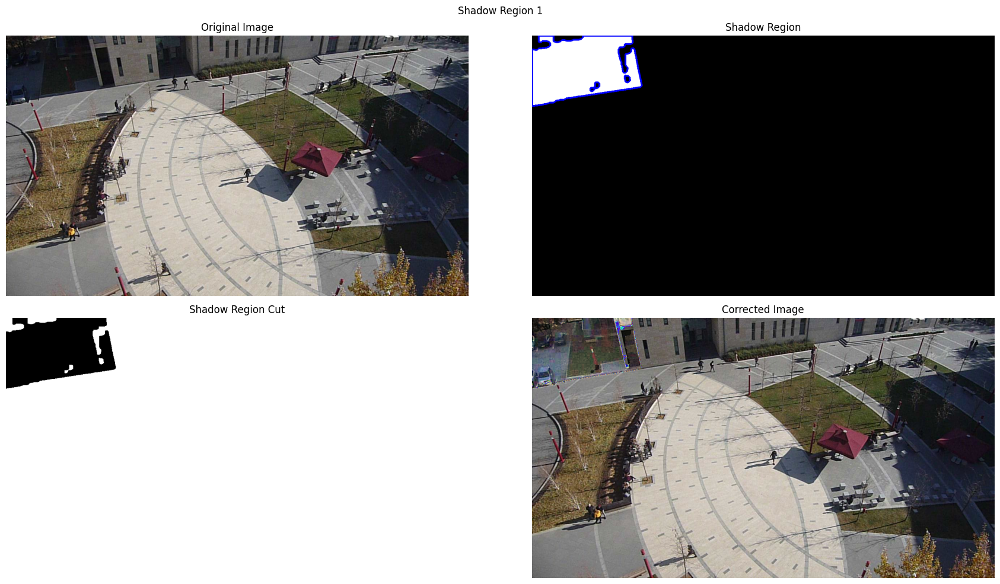

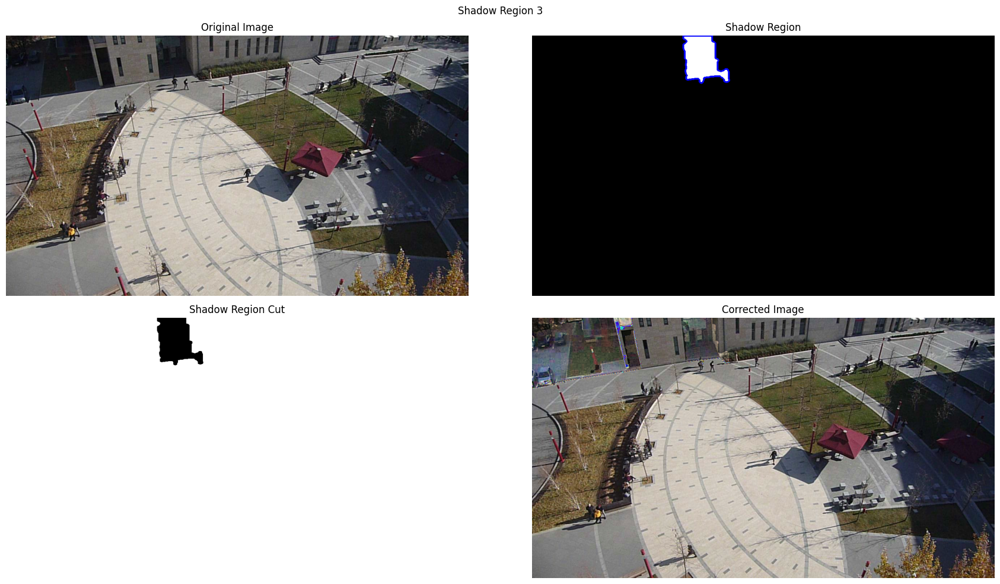

C:\Users\my asus\AppData\Local\Temp\ipykernel_19384\2776314616.py:11: RuntimeWarning: invalid value encountered in cast
  temp_img[y][x] = median_filter(img, (x, y), filter_size)


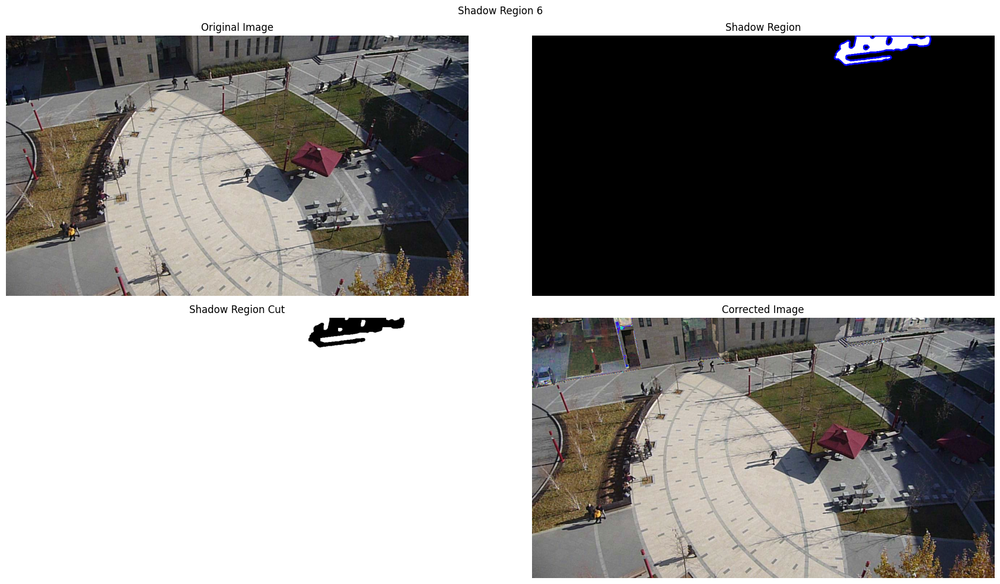

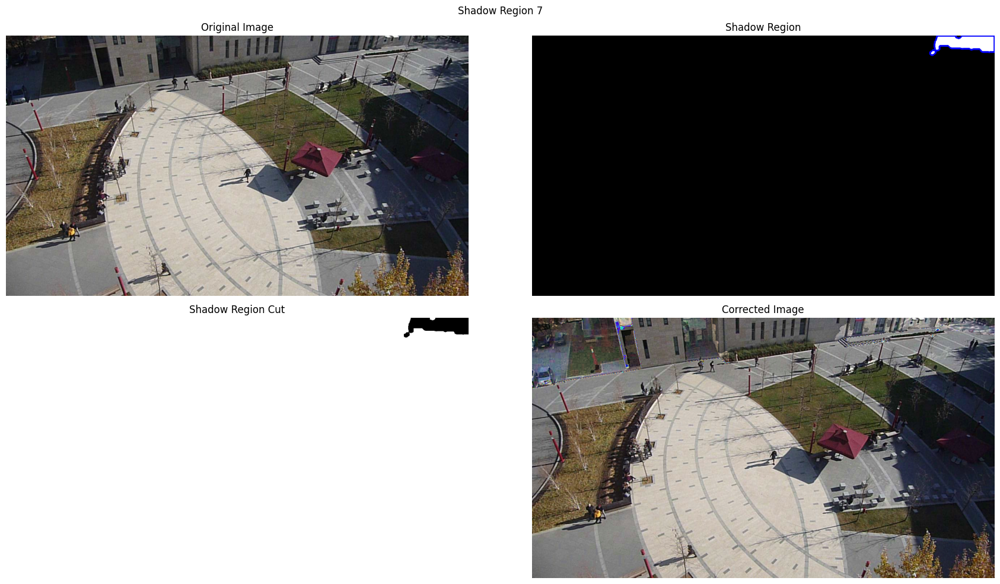

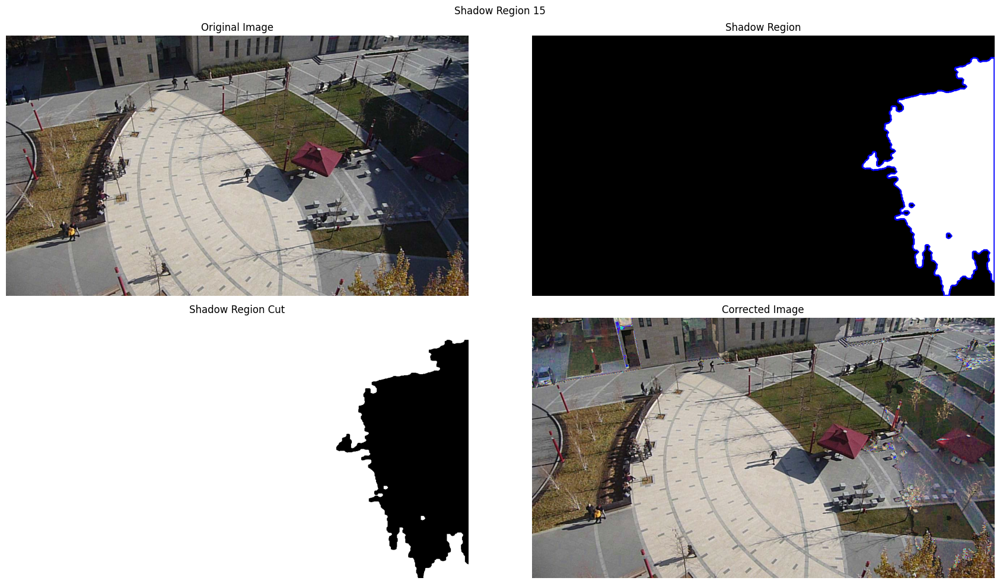

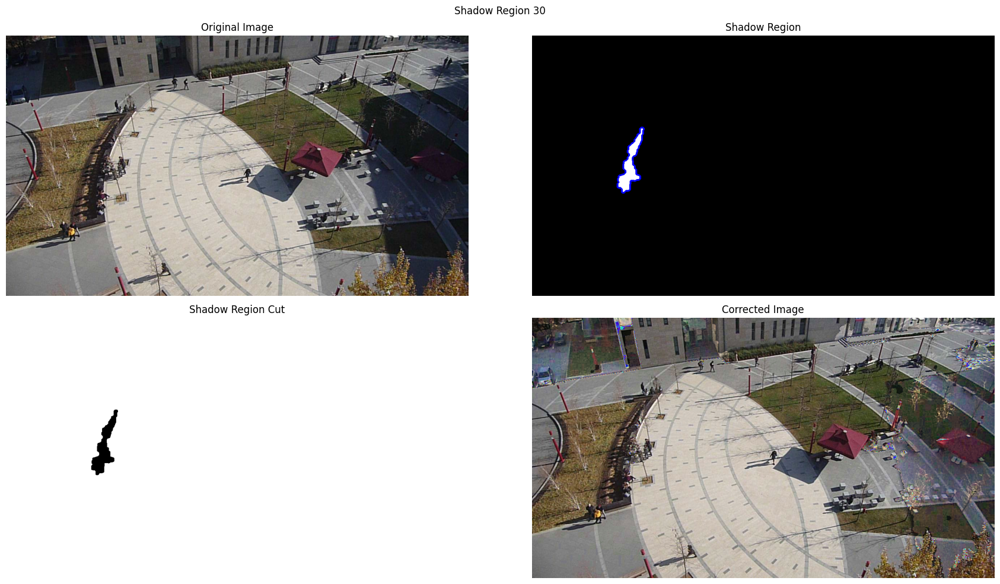

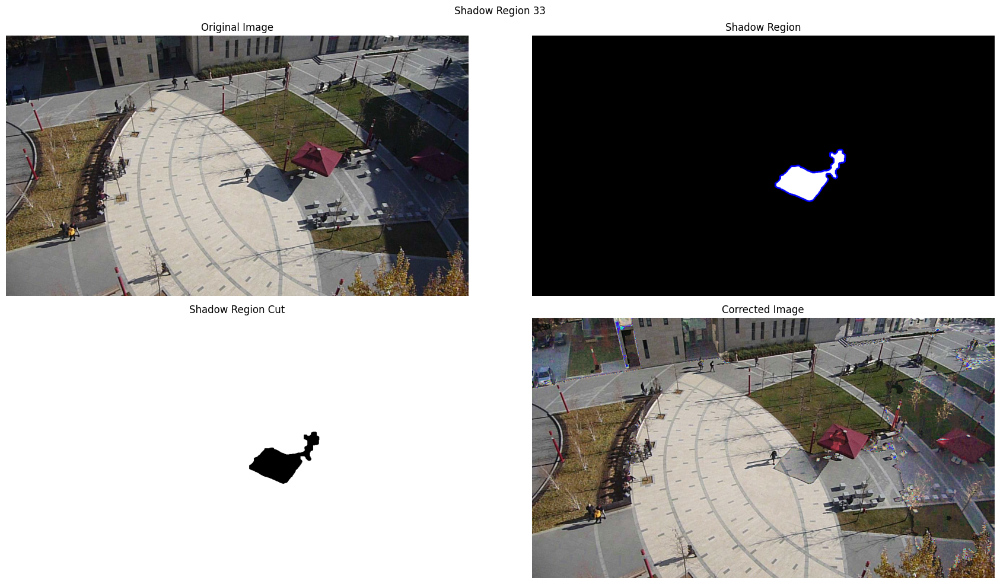

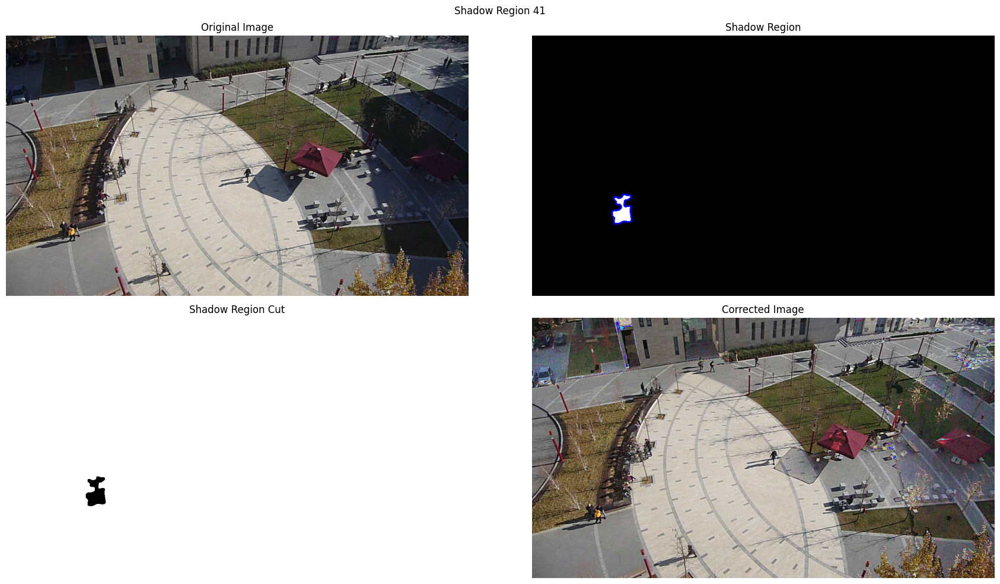

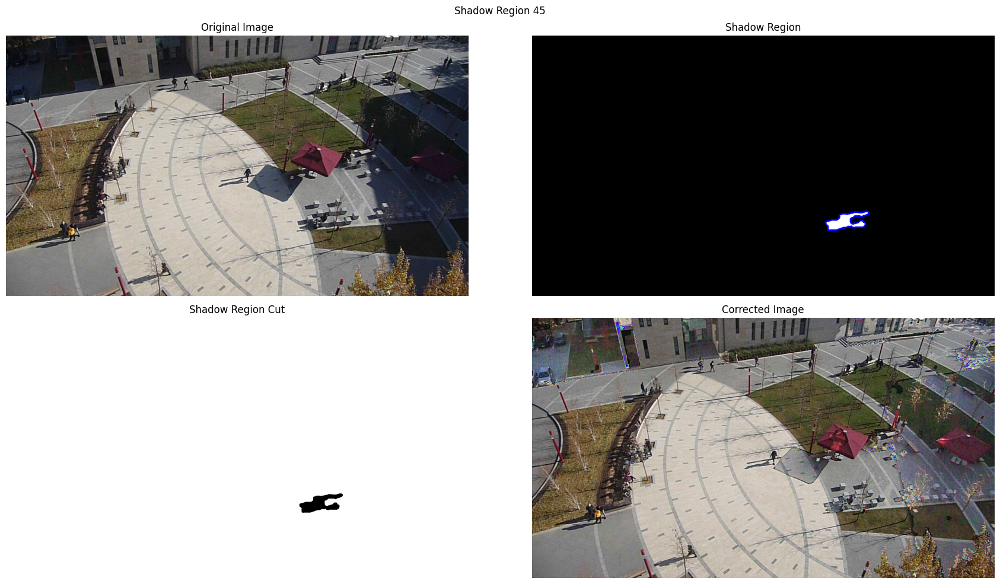

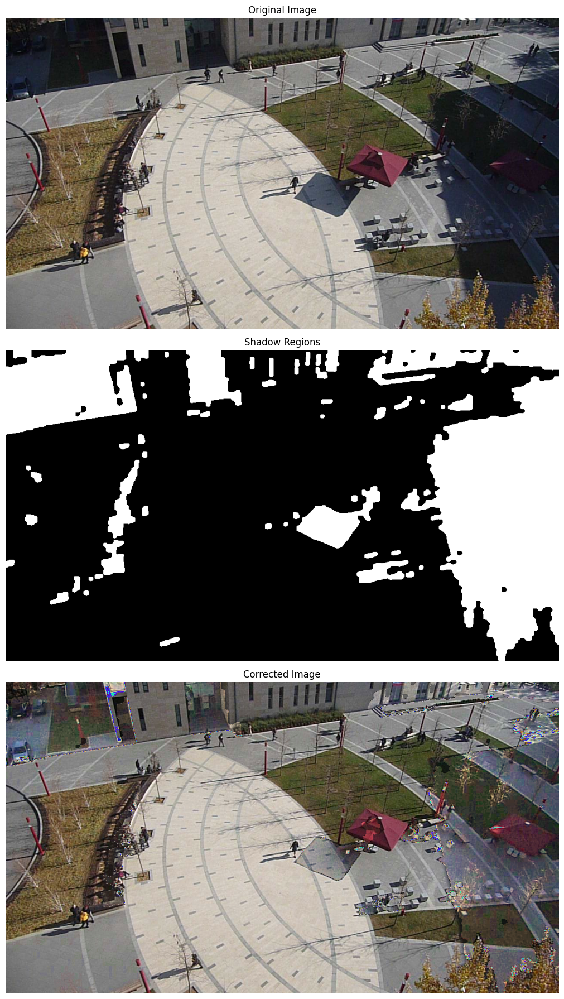

Saved result as images\test_shadowClear.jpg


In [45]:
image_path = os.path.join("images", "test.jpg")

org_image, mask, image_clear = process_image_file(
    image_path, ab_threshold=0, save=True, verbose=True
)